In [ ]:
pip install opencv-python numpy matplotlib


# Experimenting with various filters for **Denoising**

<ipython-input-8-892a38208c79>:29: RuntimeWarning: overflow encountered in scalar subtract
  B2 = z_xy - z_max


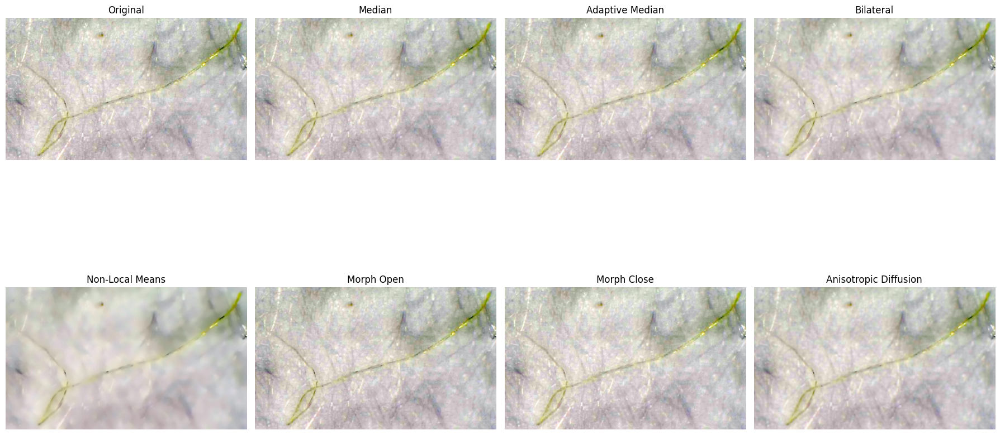

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# ----- Custom Adaptive Median Filter for Single Channel -----
def adaptive_median_filter(img, Smax=7):
    Smin = 3
    padded = np.pad(img, Smax // 2, mode='edge')
    filtered = np.zeros_like(img)
    rows, cols = img.shape

    for i in range(rows):
        for j in range(cols):
            window_size = Smin
            found = False
            while not found:
                half = window_size // 2
                window = padded[i:i + window_size, j:j + window_size]
                z_med = np.median(window)
                z_min = window.min()
                z_max = window.max()

                A1 = z_med - z_min
                A2 = z_med - z_max

                if A1 > 0 and A2 < 0:
                    z_xy = padded[i + half, j + half]
                    B1 = z_xy - z_min
                    B2 = z_xy - z_max
                    if B1 > 0 and B2 < 0:
                        filtered[i, j] = z_xy
                    else:
                        filtered[i, j] = z_med
                    found = True
                else:
                    window_size += 2
                    if window_size > Smax:
                        filtered[i, j] = z_med
                        found = True
    return filtered

# Wrapper to apply adaptive median filter on a color image (process each channel)
def apply_adaptive_median_color(img, Smax=7):
    channels = cv2.split(img)
    filtered_channels = []
    for ch in channels:
        filtered_channels.append(adaptive_median_filter(ch, Smax))
    return cv2.merge(filtered_channels)

# ----- Custom Anisotropic Diffusion for Single Channel -----
def anisotropic_diffusion(img, num_iter=15, kappa=30, gamma=0.1, option=1):
    img = img.astype('float32')
    diffused = img.copy()
    for _ in range(num_iter):
        nablaN = np.zeros_like(diffused)
        nablaS = np.zeros_like(diffused)
        nablaE = np.zeros_like(diffused)
        nablaW = np.zeros_like(diffused)

        nablaN[1:, :] = diffused[:-1, :] - diffused[1:, :]
        nablaS[:-1, :] = diffused[1:, :] - diffused[:-1, :]
        nablaW[:, 1:] = diffused[:, :-1] - diffused[:, 1:]
        nablaE[:, :-1] = diffused[:, 1:] - diffused[:, :-1]

        if option == 1:
            cN = np.exp(-(nablaN / kappa) ** 2)
            cS = np.exp(-(nablaS / kappa) ** 2)
            cW = np.exp(-(nablaW / kappa) ** 2)
            cE = np.exp(-(nablaE / kappa) ** 2)
        elif option == 2:
            cN = 1.0 / (1.0 + (nablaN / kappa) ** 2)
            cS = 1.0 / (1.0 + (nablaS / kappa) ** 2)
            cW = 1.0 / (1.0 + (nablaW / kappa) ** 2)
            cE = 1.0 / (1.0 + (nablaE / kappa) ** 2)

        diffused += gamma * (cN * nablaN + cS * nablaS + cW * nablaW + cE * nablaE)
    return diffused.astype(np.uint8)

# Wrapper to apply anisotropic diffusion on a color image (process each channel)
def apply_anisotropic_diffusion_color(img, num_iter=15, kappa=30, gamma=0.1, option=1):
    channels = cv2.split(img)
    filtered_channels = []
    for ch in channels:
        filtered_channels.append(anisotropic_diffusion(ch.astype('float32'), num_iter, kappa, gamma, option))
    return cv2.merge(filtered_channels)

# ----- Morphological Filter Wrapper for Color Images -----
def apply_morphology_color(img, operation, kernel):
    channels = cv2.split(img)
    filtered_channels = []
    for ch in channels:
        filtered_channels.append(cv2.morphologyEx(ch, operation, kernel))
    return cv2.merge(filtered_channels)

# ----- Main Script -----

# Load your color image (no conversion to grayscale)
image_path = "/content/noisey.jpeg"  # Update with your image path
img = cv2.imread(image_path, cv2.IMREAD_COLOR)
if img is None:
    raise IOError("Image not found. Please check the file path.")

# Apply Median Filter (works directly on color images)
median_filtered = cv2.medianBlur(img, ksize=3)

# Apply Adaptive Median Filter (per channel)
adaptive_median_filtered = apply_adaptive_median_color(img, Smax=7)

# Apply Bilateral Filter (color version)
bilateral_filtered = cv2.bilateralFilter(img, d=9, sigmaColor=50, sigmaSpace=100)

# Apply Non-Local Means Filter for Color
nlm_filtered = cv2.fastNlMeansDenoisingColored(img, None, h=10, hColor=10,
                                                templateWindowSize=7, searchWindowSize=21)

# Apply Morphological Filters (Opening and Closing) per channel
kernel = np.ones((3, 3), np.uint8)
morph_open = apply_morphology_color(img, cv2.MORPH_OPEN, kernel)
morph_close = apply_morphology_color(img, cv2.MORPH_CLOSE, kernel)

# Apply Anisotropic Diffusion (per channel)
anisotropic_filtered = apply_anisotropic_diffusion_color(img, num_iter=15, kappa=30, gamma=0.1, option=1)

# Display Results
titles = ['Original', 'Median', 'Adaptive Median', 'Bilateral', 'Non-Local Means',
          'Morph Open', 'Morph Close', 'Anisotropic Diffusion']
images = [img, median_filtered, adaptive_median_filtered, bilateral_filtered, nlm_filtered,
          morph_open, morph_close, anisotropic_filtered]

plt.figure(figsize=(18, 12))
for i in range(len(images)):
    plt.subplot(2, 4, i + 1)
    # OpenCV uses BGR; convert to RGB for display
    plt.imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))
    plt.title(titles[i])
    plt.axis('off')
plt.tight_layout()
plt.show()


<ipython-input-6-c06da1ac25c7>:29: RuntimeWarning: overflow encountered in scalar subtract
  B2 = z_xy - z_max


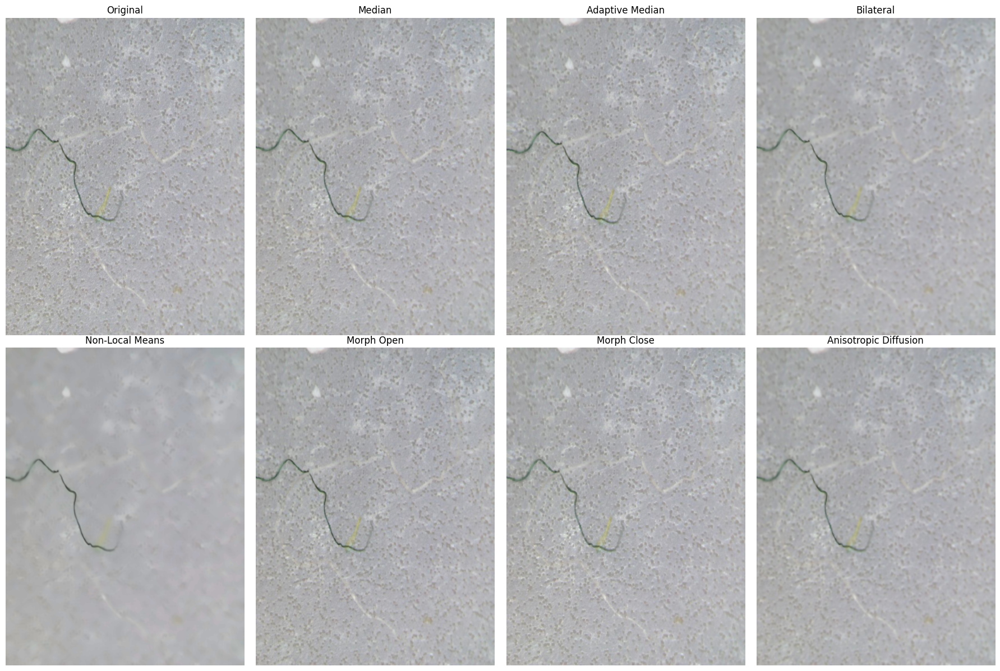

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# ----- Custom Adaptive Median Filter for Single Channel -----
def adaptive_median_filter(img, Smax=7):
    Smin = 3
    padded = np.pad(img, Smax // 2, mode='edge')
    filtered = np.zeros_like(img)
    rows, cols = img.shape

    for i in range(rows):
        for j in range(cols):
            window_size = Smin
            found = False
            while not found:
                half = window_size // 2
                window = padded[i:i + window_size, j:j + window_size]
                z_med = np.median(window)
                z_min = window.min()
                z_max = window.max()

                A1 = z_med - z_min
                A2 = z_med - z_max

                if A1 > 0 and A2 < 0:
                    z_xy = padded[i + half, j + half]
                    B1 = z_xy - z_min
                    B2 = z_xy - z_max
                    if B1 > 0 and B2 < 0:
                        filtered[i, j] = z_xy
                    else:
                        filtered[i, j] = z_med
                    found = True
                else:
                    window_size += 2
                    if window_size > Smax:
                        filtered[i, j] = z_med
                        found = True
    return filtered

# Wrapper to apply adaptive median filter on a color image (process each channel)
def apply_adaptive_median_color(img, Smax=7):
    channels = cv2.split(img)
    filtered_channels = []
    for ch in channels:
        filtered_channels.append(adaptive_median_filter(ch, Smax))
    return cv2.merge(filtered_channels)

# ----- Custom Anisotropic Diffusion for Single Channel -----
def anisotropic_diffusion(img, num_iter=30, kappa=30, gamma=0.2, option=1):
    img = img.astype('float32')
    diffused = img.copy()
    for _ in range(num_iter):
        nablaN = np.zeros_like(diffused)
        nablaS = np.zeros_like(diffused)
        nablaE = np.zeros_like(diffused)
        nablaW = np.zeros_like(diffused)

        nablaN[1:, :] = diffused[:-1, :] - diffused[1:, :]
        nablaS[:-1, :] = diffused[1:, :] - diffused[:-1, :]
        nablaW[:, 1:] = diffused[:, :-1] - diffused[:, 1:]
        nablaE[:, :-1] = diffused[:, 1:] - diffused[:, :-1]

        if option == 1:
            cN = np.exp(-(nablaN / kappa) ** 2)
            cS = np.exp(-(nablaS / kappa) ** 2)
            cW = np.exp(-(nablaW / kappa) ** 2)
            cE = np.exp(-(nablaE / kappa) ** 2)
        elif option == 2:
            cN = 1.0 / (1.0 + (nablaN / kappa) ** 2)
            cS = 1.0 / (1.0 + (nablaS / kappa) ** 2)
            cW = 1.0 / (1.0 + (nablaW / kappa) ** 2)
            cE = 1.0 / (1.0 + (nablaE / kappa) ** 2)

        diffused += gamma * (cN * nablaN + cS * nablaS + cW * nablaW + cE * nablaE)
    return diffused.astype(np.uint8)

# Wrapper to apply anisotropic diffusion on a color image (process each channel)
def apply_anisotropic_diffusion_color(img, num_iter=15, kappa=30, gamma=0.1, option=1):
    channels = cv2.split(img)
    filtered_channels = []
    for ch in channels:
        filtered_channels.append(anisotropic_diffusion(ch.astype('float32'), num_iter, kappa, gamma, option))
    return cv2.merge(filtered_channels)

# ----- Morphological Filter Wrapper for Color Images -----
def apply_morphology_color(img, operation, kernel):
    channels = cv2.split(img)
    filtered_channels = []
    for ch in channels:
        filtered_channels.append(cv2.morphologyEx(ch, operation, kernel))
    return cv2.merge(filtered_channels)

# ----- Main Script -----

# Load your color image (no conversion to grayscale)
image_path = "/content/noisey312.jpg"  # Update with your image path
img = cv2.imread(image_path, cv2.IMREAD_COLOR)
if img is None:
    raise IOError("Image not found. Please check the file path.")

# Apply Median Filter (works directly on color images)
median_filtered = cv2.medianBlur(img, ksize=3)

# Apply Adaptive Median Filter (per channel)
adaptive_median_filtered = apply_adaptive_median_color(img, Smax=14)

# Apply Bilateral Filter (color version)
bilateral_filtered = cv2.bilateralFilter(img, d=9, sigmaColor=75, sigmaSpace=75)

# Apply Non-Local Means Filter for Color
nlm_filtered = cv2.fastNlMeansDenoisingColored(img, None, h=10, hColor=10,
                                                templateWindowSize=7, searchWindowSize=21)

# Apply Morphological Filters (Opening and Closing) per channel
kernel = np.ones((3, 3), np.uint8)
morph_open = apply_morphology_color(img, cv2.MORPH_OPEN, kernel)
morph_close = apply_morphology_color(img, cv2.MORPH_CLOSE, kernel)

# Apply Anisotropic Diffusion (per channel)
anisotropic_filtered = apply_anisotropic_diffusion_color(img, num_iter=15, kappa=30, gamma=0.1, option=1)

# Display Results
titles = ['Original', 'Median', 'Adaptive Median', 'Bilateral', 'Non-Local Means',
          'Morph Open', 'Morph Close', 'Anisotropic Diffusion']
images = [img, median_filtered, adaptive_median_filtered, bilateral_filtered, nlm_filtered,
          morph_open, morph_close, anisotropic_filtered]

plt.figure(figsize=(18, 12))
for i in range(len(images)):
    plt.subplot(2, 4, i + 1)
    # OpenCV uses BGR; convert to RGB for display
    plt.imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))
    plt.title(titles[i])
    plt.axis('off')
plt.tight_layout()
plt.show()


# Experimenting with Segmentation Algorithms (K-Means, Mean-Shift)

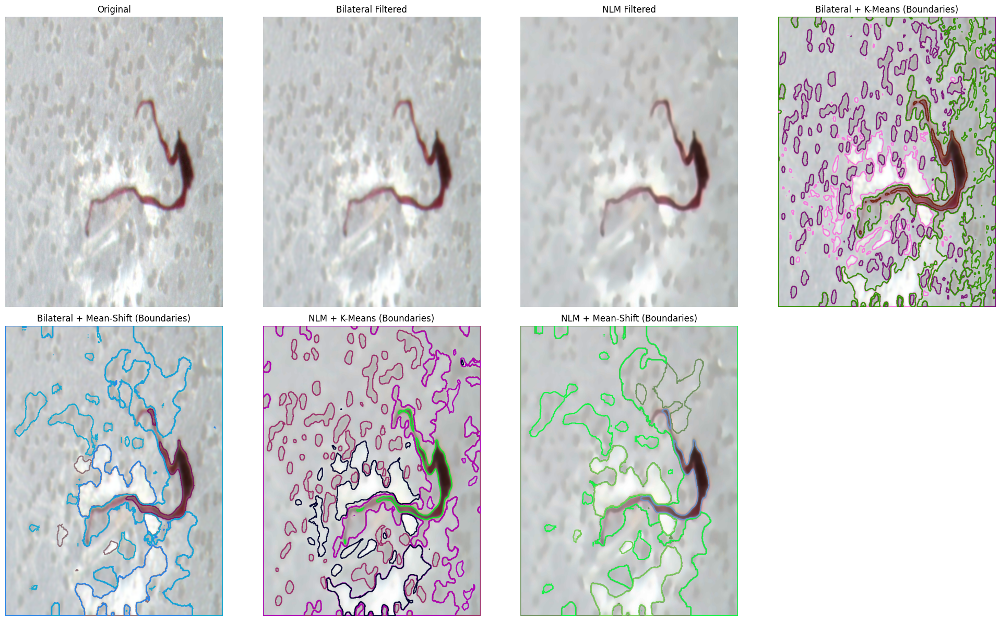

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# ----- Load Image -----
image_path = "/content/noisey4.jpg"  # Update with your image path
img = cv2.imread(image_path, cv2.IMREAD_COLOR)
if img is None:
    raise IOError("Image not found. Please check the file path.")

# ----- Denoising Filters -----
# 1. Bilateral Filter: smooths while preserving edges.
bilateral_filtered = cv2.bilateralFilter(img, d=9, sigmaColor=100, sigmaSpace=200)

# 2. Non-Local Means Filter: reduces noise by averaging similar patches.
nlm_filtered = cv2.fastNlMeansDenoisingColored(img, None, h=10, hColor=200,
                                                templateWindowSize=7, searchWindowSize=21)

# ----- Segmentation Functions -----
def kmeans_segmentation_with_labels(image, k=4):
    """
    Segment an image using k–means clustering.
    Returns both the segmented image and the label map.
    """
    Z = image.reshape((-1, 3))
    Z = np.float32(Z)
    # Define criteria and apply k–means.
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
    ret, label, center = cv2.kmeans(Z, k, None, criteria, attempts=10,
                                    flags=cv2.KMEANS_RANDOM_CENTERS)
    center = np.uint8(center)
    segmented = center[label.flatten()].reshape(image.shape)
    labels = label.reshape(image.shape[:2])
    return segmented, labels

def mean_shift_segmentation(image, sp=21, sr=51):
    """
    Apply mean–shift segmentation using OpenCV's pyrMeanShiftFiltering.
    Returns the filtered image.
    """
    return cv2.pyrMeanShiftFiltering(image, sp=sp, sr=sr)

def overlay_boundaries(image, labels):
    """
    Draw contours (boundaries) of segmented regions over the image.
    Each region is outlined in a random color.
    """
    overlay = image.copy()
    unique_labels = np.unique(labels)
    for label in unique_labels:
        # Create a mask for the current label.
        mask = np.uint8((labels == label) * 255)
        # Find contours from the mask.
        contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL,
                                       cv2.CHAIN_APPROX_SIMPLE)
        # Choose a random color.
        color = tuple(np.random.randint(0, 255, 3).tolist())
        cv2.drawContours(overlay, contours, -1, color, 2)
    return overlay

# ----- Segmentation on Filtered Images -----

# For Bilateral Filtered Image:
# a) K-Means Segmentation
seg_bil_km, labels_bil_km = kmeans_segmentation_with_labels(bilateral_filtered, k=4)
overlay_bil_km = overlay_boundaries(bilateral_filtered, labels_bil_km)

# b) Mean-Shift Segmentation + approximate labels via k-means on mean–shift result.
ms_bil = mean_shift_segmentation(bilateral_filtered, sp=21, sr=51)
# Here, we approximate the label map by applying k–means on the mean–shift image.
_, labels_bil_ms = kmeans_segmentation_with_labels(ms_bil, k=4)
overlay_bil_ms = overlay_boundaries(bilateral_filtered, labels_bil_ms)

# For Non-Local Means (NLM) Filtered Image:
# a) K-Means Segmentation
seg_nlm_km, labels_nlm_km = kmeans_segmentation_with_labels(nlm_filtered, k=4)
overlay_nlm_km = overlay_boundaries(nlm_filtered, labels_nlm_km)

# b) Mean-Shift Segmentation + approximate labels via k-means.
ms_nlm = mean_shift_segmentation(nlm_filtered, sp=21, sr=51)
_, labels_nlm_ms = kmeans_segmentation_with_labels(ms_nlm, k=4)
overlay_nlm_ms = overlay_boundaries(nlm_filtered, labels_nlm_ms)

# ----- Display Results -----
titles = [
    'Original',
    'Bilateral Filtered',
    'NLM Filtered',
    'Bilateral + K-Means (Boundaries)',
    'Bilateral + Mean-Shift (Boundaries)',
    'NLM + K-Means (Boundaries)',
    'NLM + Mean-Shift (Boundaries)'
]

images = [
    img,
    bilateral_filtered,
    nlm_filtered,
    overlay_bil_km,
    overlay_bil_ms,
    overlay_nlm_km,
    overlay_nlm_ms
]

plt.figure(figsize=(20, 12))
for i in range(len(images)):
    plt.subplot(2, 4, i+1)
    # Convert from BGR to RGB for display.
    plt.imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))
    plt.title(titles[i])
    plt.axis('off')
plt.tight_layout()
plt.show()


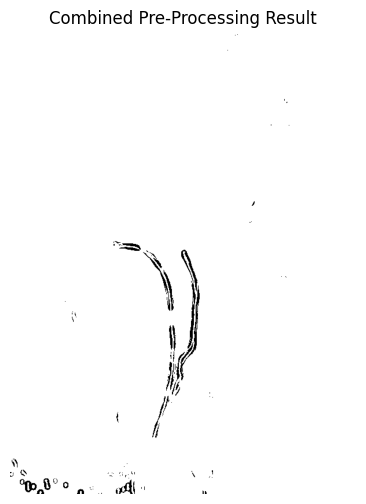

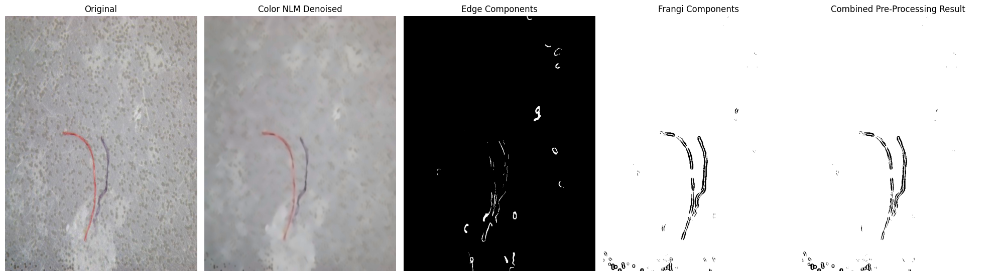

True

In [ ]:
ximport cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.filters import frangi
from sklearn.cluster import KMeans

def microplastic_segmentation_color_nlm(image_path):
     # 1. Load image with verification
    image = cv2.imread(image_path)
    if image is None:
        raise FileNotFoundError("Image not found or invalid format")

    # 2. Apply Color Non-Local Means Denoising
    nlm_denoised = cv2.fastNlMeansDenoisingColored(
        image,
        h=10,
        hColor=10,
        templateWindowSize=7,
        searchWindowSize=21
    )

    # 3. Convert to grayscale for edge detection and Frangi filter
    gray = cv2.cvtColor(nlm_denoised, cv2.COLOR_BGR2GRAY)

    # 4. Enhanced Canny edges with dilation
    edges = cv2.Canny(gray, threshold1=25, threshold2=55)
    dilated_edges = cv2.dilate(edges, kernel=np.ones((3,3), np.uint8), iterations=2)

    # 5. K-means clustering on COLOR features
    def color_kmeans_mask(img, k=3):
        pixels = img.reshape(-1, 3).astype(np.float32)  # Use all 3 color channels
        kmeans = KMeans(n_clusters=k, random_state=0).fit(pixels)
        return kmeans.labels_.reshape(img.shape[:2])  # Return 2D mask

    color_mask = color_kmeans_mask(nlm_denoised)

    # 6. Frangi filter on grayscale
    frangi_enhanced = frangi(gray, sigmas=range(1, 4), beta=0.75, gamma=10)
    frangi_enhanced = cv2.normalize(frangi_enhanced, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)


    # 7. Combine segmentation approaches
    mask = (color_mask == 1).astype(np.uint8) * 255
    edge_mask = cv2.bitwise_and(dilated_edges, mask)

    combined = cv2.bitwise_or(
        edge_mask,
        cv2.adaptiveThreshold(frangi_enhanced, 255,
                            cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                            cv2.THRESH_BINARY, 11, 2)
    )

    # NEW: Explicit combined result visualization
    plt.figure(figsize=(12, 6))
    plt.subplot(121), plt.imshow(combined, cmap='gray')
    plt.title('Combined Pre-Processing Result')
    plt.axis('off')

     # 8. Morphological refinement
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
    refined = cv2.morphologyEx(combined, cv2.MORPH_CLOSE, kernel, iterations=1)
    # refined = cv2.morphologyEx(refined, cv2.MORPH_OPEN, kernel, iterations=1)

    # 9. Final cleanup
    _, markers = cv2.connectedComponents(refined)
    result = np.uint8(255 * (markers > 1))

    # Modified visualization to show progression
    plt.figure(figsize=(20, 12))
    stages = [
        ("Original", cv2.cvtColor(image, cv2.COLOR_BGR2RGB)),
        ("Color NLM Denoised", cv2.cvtColor(nlm_denoised, cv2.COLOR_BGR2RGB)),
        ("Edge Components", edge_mask),
        ("Frangi Components", cv2.adaptiveThreshold(frangi_enhanced, 255,
                                                   cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                                   cv2.THRESH_BINARY, 11, 2)),
        ("Combined Pre-Processing Result", combined),
        # ("Final Segmentation", result)
    ]

    for i, (title, img) in enumerate(stages):
        plt.subplot(2, 5, i+1)
        if title in ["Original", "Color NLM Denoised"]:
            plt.imshow(img)
        else:
            plt.imshow(img, cmap='gray')
        plt.title(title)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

    return result

result = microplastic_segmentation_color_nlm("/content/noisey264.jpg")
cv2.imwrite("color_nlm_segmentation_result.png", result)

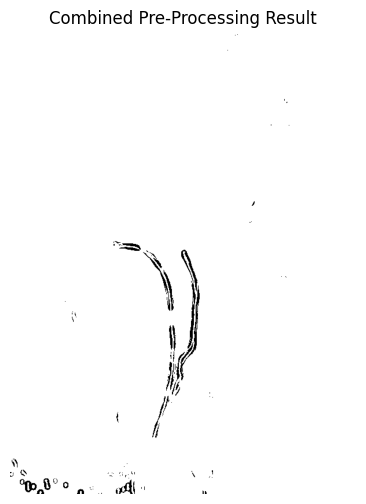

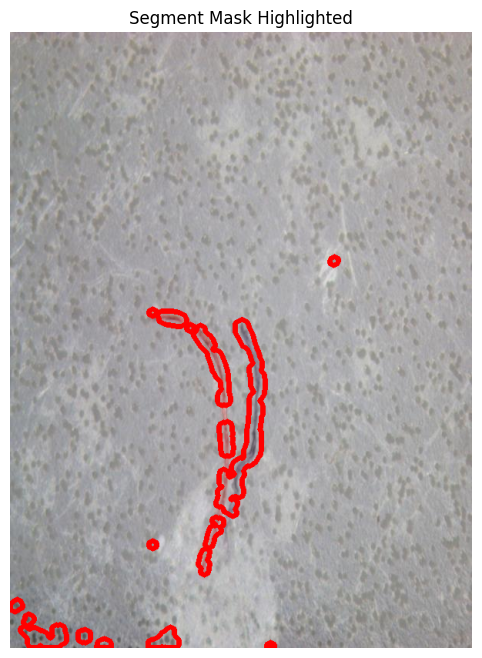

True

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.filters import frangi
from sklearn.cluster import KMeans

def microplastic_segmentation_color_nlm(image_path):
     # 1. Load image with verification
    image = cv2.imread(image_path)
    if image is None:
        raise FileNotFoundError("Image not found or invalid format")

    # 2. Apply Color Non-Local Means Denoising
    nlm_denoised = cv2.fastNlMeansDenoisingColored(
        image,
        h=10,
        hColor=10,
        templateWindowSize=7,
        searchWindowSize=21
    )

    # 3. Convert to grayscale for edge detection and Frangi filter
    gray = cv2.cvtColor(nlm_denoised, cv2.COLOR_BGR2GRAY)

    # 4. Enhanced Canny edges with dilation
    edges = cv2.Canny(gray, threshold1=25, threshold2=55)
    dilated_edges = cv2.dilate(edges, kernel=np.ones((3,3), np.uint8), iterations=2)

    # 5. K-means clustering on COLOR features
    def color_kmeans_mask(img, k=3):
        pixels = img.reshape(-1, 3).astype(np.float32)  # Use all 3 color channels
        kmeans = KMeans(n_clusters=k, random_state=0).fit(pixels)
        return kmeans.labels_.reshape(img.shape[:2])  # Return 2D mask

    color_mask = color_kmeans_mask(nlm_denoised)

    # 6. Frangi filter on grayscale
    frangi_enhanced = frangi(gray, sigmas=range(1, 4), beta=0.75, gamma=10)
    frangi_enhanced = cv2.normalize(frangi_enhanced, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)


    # 7. Combine segmentation approaches
    mask = (color_mask == 1).astype(np.uint8) * 255
    edge_mask = cv2.bitwise_and(dilated_edges, mask)

    combined = cv2.bitwise_or(
        edge_mask,
        cv2.adaptiveThreshold(frangi_enhanced, 255,
                            cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                            cv2.THRESH_BINARY, 11, 2)
    )

    # NEW: Explicit combined result visualization
    plt.figure(figsize=(12, 6))
    plt.subplot(121), plt.imshow(combined, cmap='gray')
    plt.title('Combined Pre-Processing Result')
    plt.axis('off')

     # 8. Morphological refinement
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
    refined = cv2.morphologyEx(combined, cv2.MORPH_CLOSE, kernel, iterations=1)
    refined = cv2.morphologyEx(refined, cv2.MORPH_OPEN, kernel, iterations=5)
    # refined = cv2.morphologyEx(refined, cv2.MORPH_OPEN, kernel, iterations=5)

    # ----- NEW: Highlight Segmentation Boundaries -----
# Assume 'refined' is a binary mask (with objects as black and background as white)
# If your objects (segments) are black (0) on a white (255) background, invert the mask so that objects become white.
    inv_refined = cv2.bitwise_not(refined)

    # Dilate the inverted mask to merge nearby boundaries.
    # Adjust the kernel size and iterations to control how aggressively nearby lines are merged.
    kernel_highlight = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    dilated_for_contours = cv2.dilate(inv_refined, kernel_highlight, iterations=2)

    # Find contours on the dilated mask.
    contours, _ = cv2.findContours(dilated_for_contours, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Draw the contours on a copy of the original image with a thick line.
    highlighted = image.copy()
    cv2.drawContours(highlighted, contours, -1, (0, 0, 255), thickness=5)

    # Display the highlighted segmentation.
    plt.figure(figsize=(8, 8))
    plt.imshow(cv2.cvtColor(highlighted, cv2.COLOR_BGR2RGB))
    plt.title("Segment Mask Highlighted")
    plt.axis("off")
    plt.show()

    # Optionally, save the highlighted result.
    cv2.imwrite("highlighted_segmentation.png", highlighted)


    return result

result = microplastic_segmentation_color_nlm("/content/noisey264.jpg")
cv2.imwrite("color_nlm_segmentation_result.png", result)

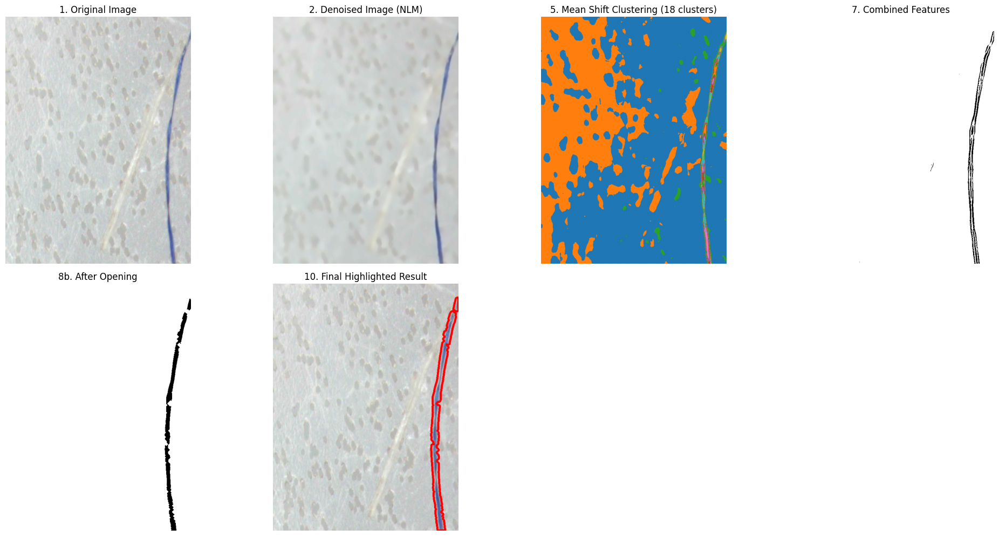

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.filters import frangi
from sklearn.cluster import MeanShift, estimate_bandwidth

def microplastic_segmentation_color_nlm(image_path):
    # Create a large figure for all processing steps
    plt.figure(figsize=(20, 15))
    plot_idx = 1

    # 1. Load image with verification
    image = cv2.imread(image_path)
    if image is None:
        raise FileNotFoundError("Image not found or invalid format")

    # Display original image
    plt.subplot(3, 4, plot_idx)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('1. Original Image')
    plt.axis('off')
    plot_idx += 1

    # 2. Apply Color Non-Local Means Denoising
    nlm_denoised = cv2.fastNlMeansDenoisingColored(
        image,
        h=10,
        hColor=10,
        templateWindowSize=7,
        searchWindowSize=21
    )

    # Display denoised image
    plt.subplot(3, 4, plot_idx)
    plt.imshow(cv2.cvtColor(nlm_denoised, cv2.COLOR_BGR2RGB))
    plt.title('2. Denoised Image (NLM)')
    plt.axis('off')
    plot_idx += 1

    # 3. Convert to grayscale
    gray = cv2.cvtColor(nlm_denoised, cv2.COLOR_BGR2GRAY)
    # plt.subplot(3, 4, plot_idx)
    # plt.imshow(gray, cmap='gray')
    # plt.title('3. Grayscale Conversion')
    # plt.axis('off')
    # plot_idx += 1

    # 4. Enhanced Canny edges with dilation
    edges = cv2.Canny(gray, threshold1=25, threshold2=55)
    dilated_edges = cv2.dilate(edges, kernel=np.ones((3,3), np.uint8), iterations=2)
    # plt.subplot(3, 4, plot_idx)
    # plt.imshow(dilated_edges, cmap='gray')
    # plt.title('4. Canny Edges + Dilation')
    # plt.axis('off')
    # plot_idx += 1

    # 5. Mean Shift clustering on COLOR features
    def color_meanshift_mask(img):
        # Reshape image to pixel array
        pixels = img.reshape(-1, 3).astype(np.float32)

        # Estimate bandwidth for Mean Shift
        bandwidth = estimate_bandwidth(pixels, quantile=0.2, n_samples=500)

        # Perform Mean Shift clustering
        ms = MeanShift(bandwidth=bandwidth, bin_seeding=True)
        ms.fit(pixels)

        return ms.labels_.reshape(img.shape[:2])

    color_mask = color_meanshift_mask(nlm_denoised)

    # Automatically select cluster with strongest edge response
    cluster_ids = np.unique(color_mask)
    cluster_scores = []
    for cid in cluster_ids:
        cluster_mask = (color_mask == cid).astype(np.uint8)
        cluster_scores.append(cv2.mean(dilated_edges, mask=cluster_mask)[0])
    target_cluster = cluster_ids[np.argmax(cluster_scores)]

    plt.subplot(3, 4, plot_idx)
    plt.imshow(color_mask, cmap='tab10')
    plt.title(f'5. Mean Shift Clustering ({len(cluster_ids)} clusters)')
    plt.axis('off')
    plot_idx += 1

    # 6. Frangi filter on grayscale
    frangi_enhanced = frangi(gray, sigmas=range(1, 4), beta=0.75, gamma=10)
    frangi_enhanced = cv2.normalize(frangi_enhanced, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    # plt.subplot(3, 4, plot_idx)
    # plt.imshow(frangi_enhanced, cmap='gray')
    # plt.title('6. Frangi Filter Enhanced')
    # plt.axis('off')
    # plot_idx += 1

    # 7. Combine segmentation approaches
    mask = (color_mask == target_cluster).astype(np.uint8) * 255
    edge_mask = cv2.bitwise_and(dilated_edges, mask)
    combined = cv2.bitwise_or(
        edge_mask,
        cv2.adaptiveThreshold(frangi_enhanced, 255,
                              cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                              cv2.THRESH_BINARY, 11, 2)
    )
    plt.subplot(3, 4, plot_idx)
    plt.imshow(combined, cmap='gray')
    plt.title('7. Combined Features')
    plt.axis('off')
    plot_idx += 1

    # 8. Morphological refinement
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))

    # Show closing result
    closed = cv2.morphologyEx(combined, cv2.MORPH_CLOSE, kernel, iterations=1)
    # plt.subplot(3, 4, plot_idx)
    # plt.imshow(closed, cmap='gray')
    # plt.title('8a. After Closing')
    # plt.axis('off')
    # plot_idx += 1

    # Show opening result
    refined = cv2.morphologyEx(closed, cv2.MORPH_OPEN, kernel, iterations=5)
    plt.subplot(3, 4, plot_idx)
    plt.imshow(refined, cmap='gray')
    plt.title('8b. After Opening')
    plt.axis('off')
    plot_idx += 1

    # 9. Remove Small Circular Blobs
    refined_no_blobs = refined.copy()
    contours, _ = cv2.findContours(refined_no_blobs, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    min_area_threshold = 200
    circularity_threshold = 0.8

    for cnt in contours:
        area = cv2.contourArea(cnt)
        if area < min_area_threshold:
            perimeter = cv2.arcLength(cnt, True)
            if perimeter == 0:
                continue
            circularity = 4 * np.pi * area / (perimeter * perimeter)
            if circularity > circularity_threshold:
                cv2.drawContours(refined_no_blobs, [cnt], -1, 0, -1)

    # plt.subplot(3, 4, plot_idx)
    # plt.imshow(refined_no_blobs, cmap='gray')
    # plt.title('9. After Blob Removal')
    # plt.axis('off')
    # plot_idx += 1

    # 10. Final Highlighted Segmentation
    inv_refined = cv2.bitwise_not(refined_no_blobs)
    kernel_highlight = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    dilated_for_contours = cv2.dilate(inv_refined, kernel_highlight, iterations=2)
    contours, _ = cv2.findContours(dilated_for_contours, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    highlighted = image.copy()
    cv2.drawContours(highlighted, contours, -1, (0, 0, 255), thickness=5)

    plt.subplot(3, 4, plot_idx)
    plt.imshow(cv2.cvtColor(highlighted, cv2.COLOR_BGR2RGB))
    plt.title('10. Final Highlighted Result')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

    # Save results
    cv2.imwrite("color_nlm_segmentation_result.png", refined_no_blobs)
    cv2.imwrite("highlighted_segmentation.png", highlighted)

    return refined_no_blobs

# Execute the pipeline
result = microplastic_segmentation_color_nlm("/content/noisey300.jpg")

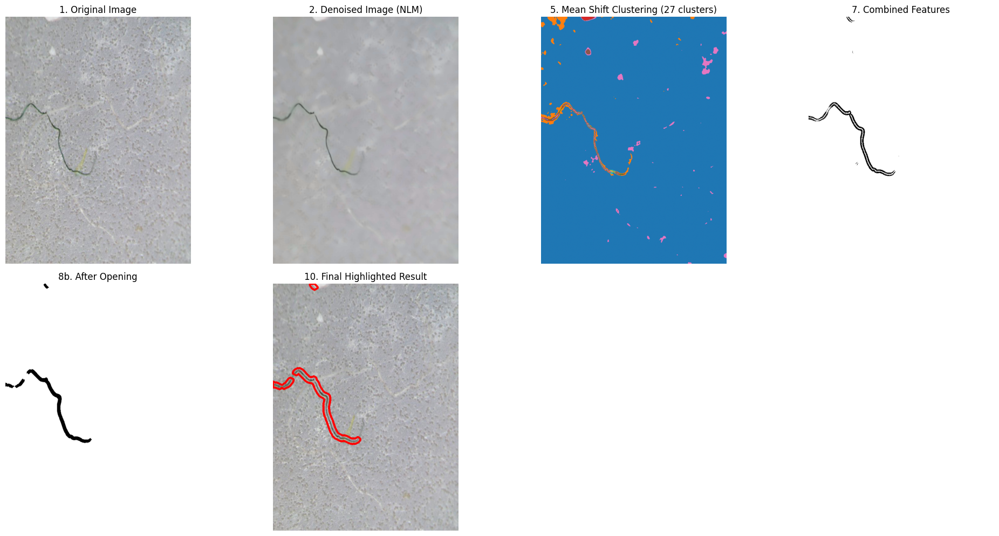

In [ ]:
# Execute the pipeline
result = microplastic_segmentation_color_nlm("/content/noisey312.jpg")